In [1]:
import pickle
from pathlib import Path

import numpy as np
import graspy as gs
from graspy.embed import MultipleASE

import seaborn as sns
import matplotlib.pyplot as plt

from joblib import Parallel, delayed

from tqdm import tqdm_notebook as tqdm

%matplotlib inline

# MASE on `aff`

Run on `aff` matrices

In [2]:
# Get data
p = Path('../../../marguiles/similarities/') #change path as needed
files = sorted(p.glob('*.npz'))

In [ ]:
# load the matrices
graphs = [np.load(f)['aff'] for f in files]

In [ ]:
# Compute MASE
mase = MultipleASE(unscaled=False)

mase.fit(graphs)

In [5]:
mase.latent_left_.shape

(18715, 4)

In [ ]:
# Saving the fit model
with open('./models/mpi_mase_aff_model.pkl', 'wb') as f:
    pickle.dump(mase, f)

## Load the model

In [3]:
with open('./models/mpi_mase_aff_model.pkl', 'rb') as f:
    mase = pickle.load(f)

## Visualize `V` matrix

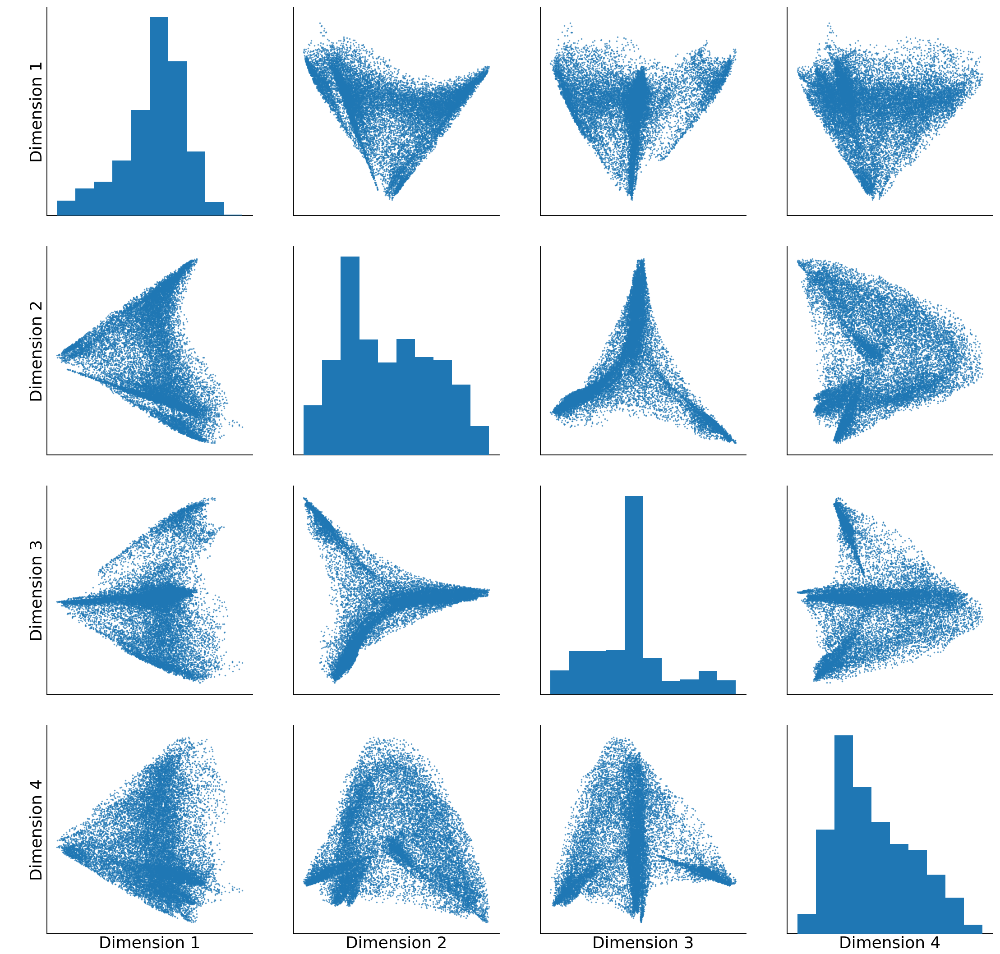

In [4]:
g = gs.plot.pairplot(mase.latent_left_, height=8, font_scale=2)

## Visualize `R^i x V`

In [4]:
cat = np.concatenate(mase.latent_left_ @ mase.scores_)

labels = np.repeat(np.array([f.parts[-1].split('.')[1] for f in files]), 18715)

Text(0, 0.5, 'Dimension 2')

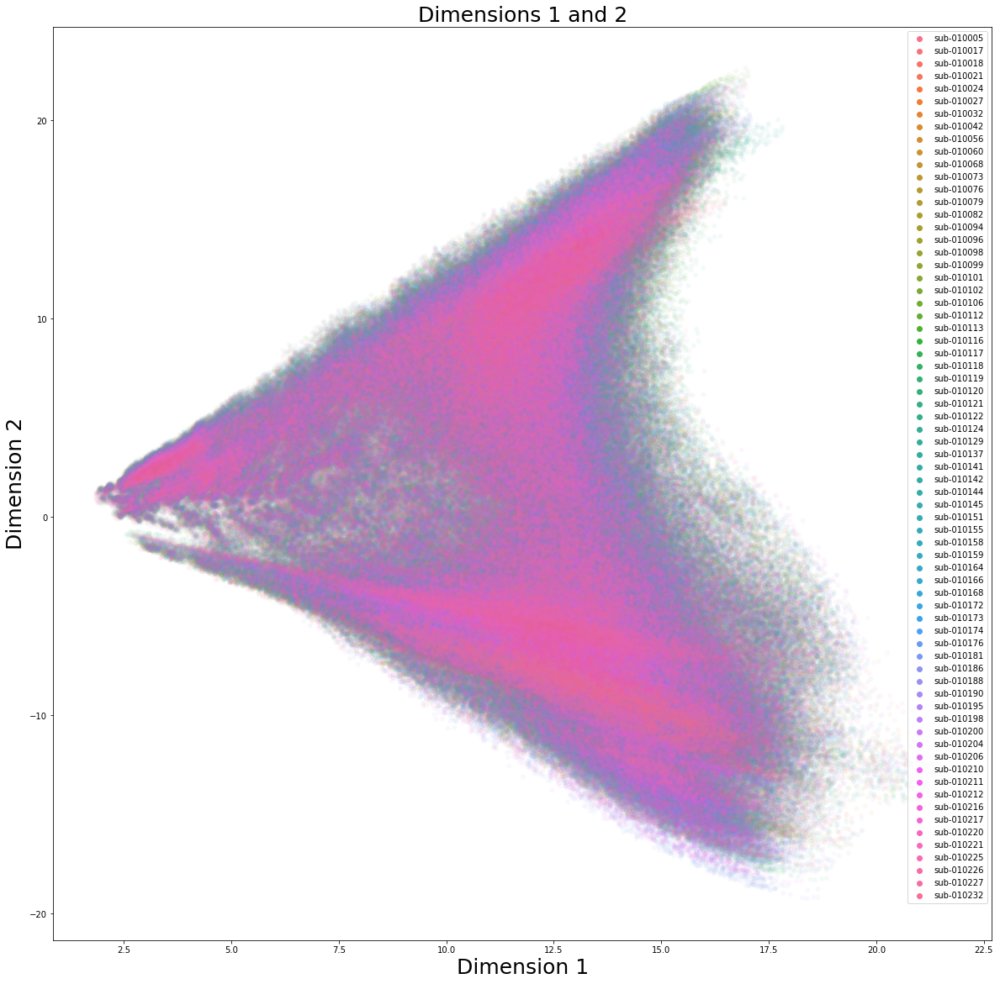

In [8]:
fig, ax = plt.subplots(figsize=(20, 20))

sns.scatterplot(x= cat[:, 0], y = cat[:, 1], hue=labels, linewidth=0, alpha = 0.05, ax = ax)
ax.set_title("Dimensions 1 and 2", fontsize=25)
ax.set_xlabel("Dimension 1", fontsize=25)
ax.set_ylabel("Dimension 2", fontsize=25)

Text(0, 0.5, 'Dimension 3')

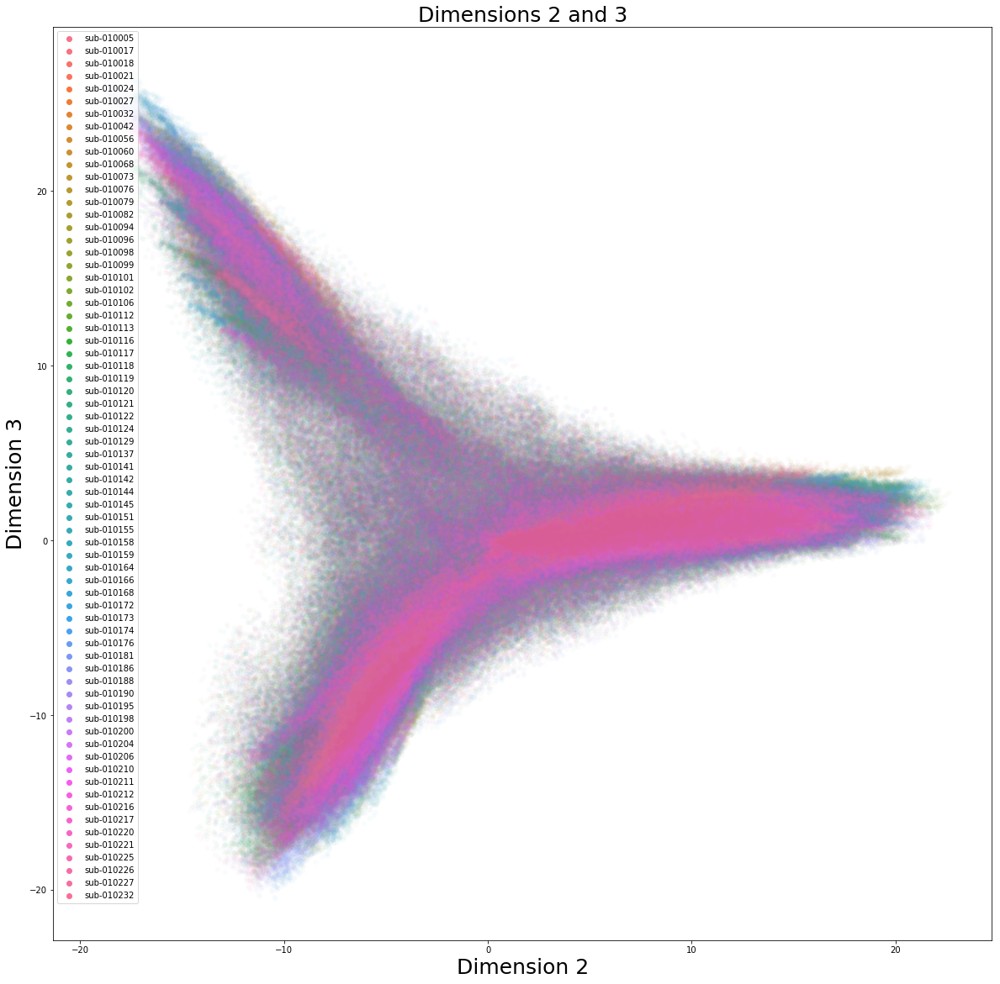

In [9]:
fig, ax = plt.subplots(figsize=(20, 20))

sns.scatterplot(x= cat[:, 1], y = cat[:, 2], hue=labels, linewidth=0, alpha = 0.03, ax = ax)
ax.set_title("Dimensions 2 and 3", fontsize=25)
ax.set_xlabel("Dimension 2", fontsize=25)
ax.set_ylabel("Dimension 3", fontsize=25)

Text(0, 0.5, 'Dimension 3')

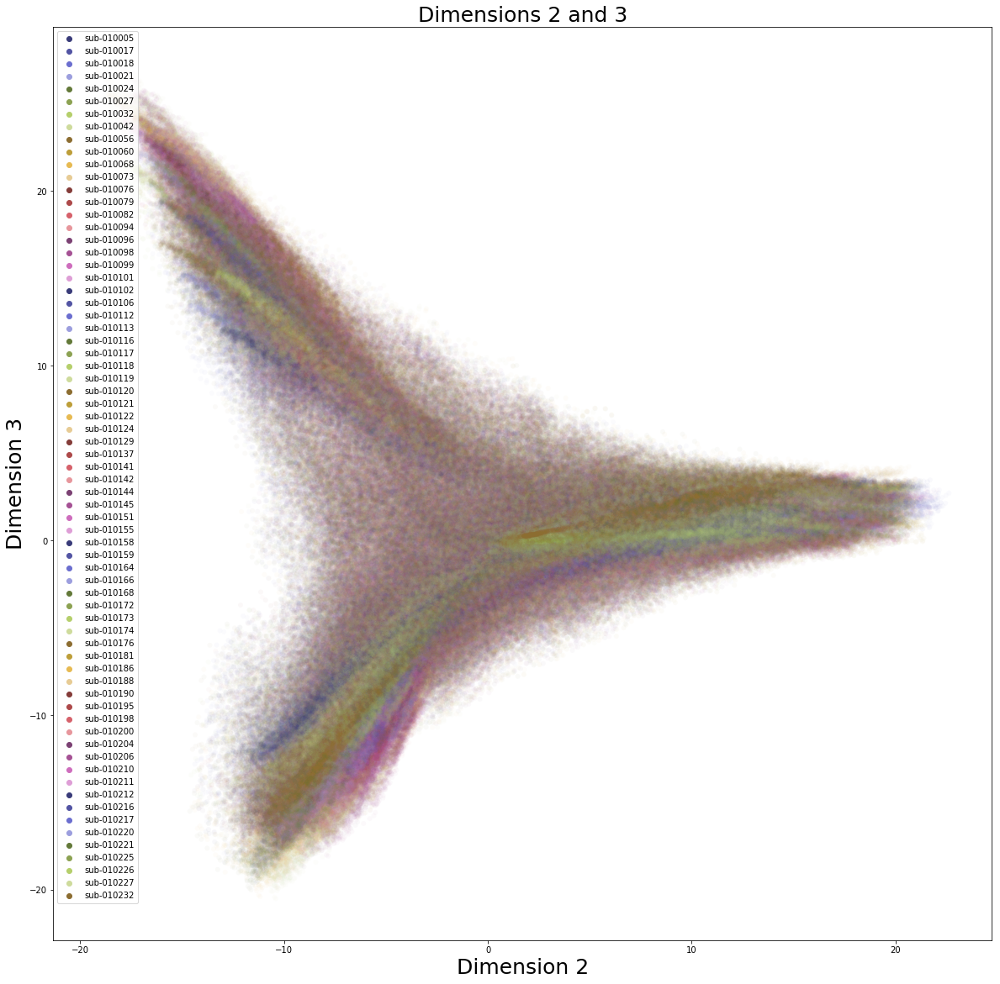

In [10]:
fig, ax = plt.subplots(figsize=(20, 20))

sns.scatterplot(x= cat[:, 1], y = cat[:, 2], hue=labels, linewidth=0, alpha = 0.03, ax = ax, palette='tab20b')
ax.set_title("Dimensions 2 and 3", fontsize=25)
ax.set_xlabel("Dimension 2", fontsize=25)
ax.set_ylabel("Dimension 3", fontsize=25)

# MASE on `K` matrices

In [ ]:
del graphs

graphs = [np.load(f)['K'] for f in files]

In [ ]:
mase = MultipleASE(unscaled=False)

mase.fit(graphs)

In [13]:
mase.latent_left_.shape

(18715, 5)

In [ ]:
# Saving the fit model
with open('./models/mpi_mase_K_model.pkl', 'wb') as f:
    pickle.dump(mase, f)

## Load the model

In [12]:
with open('./models/mpi_mase_K_model.pkl', 'rb') as f:
    mase = pickle.load(f)

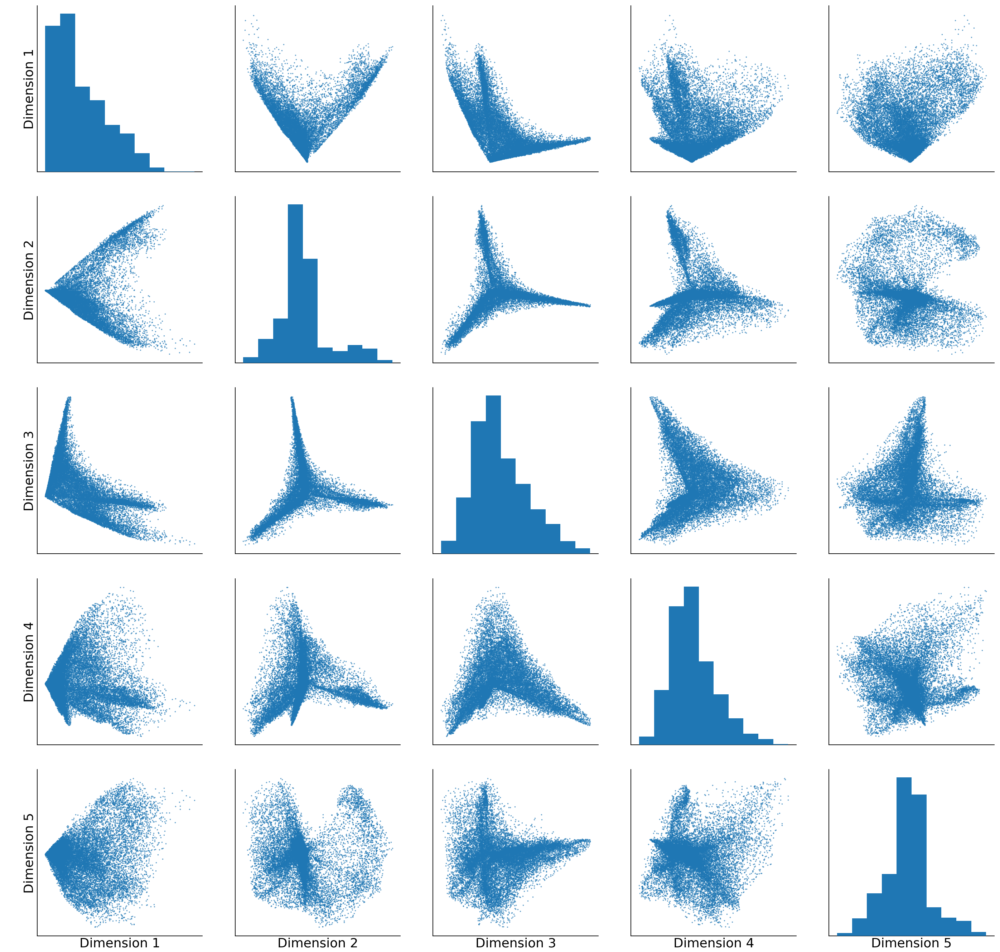

In [14]:
g = gs.plot.pairplot(mase.latent_left_, height=8, font_scale=2)

# MASE on `PTR(K)`

Using pass to ranks = 'simple-nonzero'

In [ ]:
graphs = [np.load(f)['K'] for f in files]

ptr = []
for g in tqdm(graphs):
    ptr.append(gs.utils.pass_to_ranks(g))

In [ ]:
mase = MultipleASE(unscaled=False)

mase.fit(ptr)

In [20]:
mase.latent_left_.shape

(18715, 4)

In [ ]:
# Saving the fit model
with open('./models/mpi_mase_K_PTR_model.pkl', 'wb') as f:
    pickle.dump(mase, f)

## Load the model 

In [18]:
with open('./models/mpi_mase_K_PTR_model.pkl', 'rb') as f:
    mase = pickle.load(f)

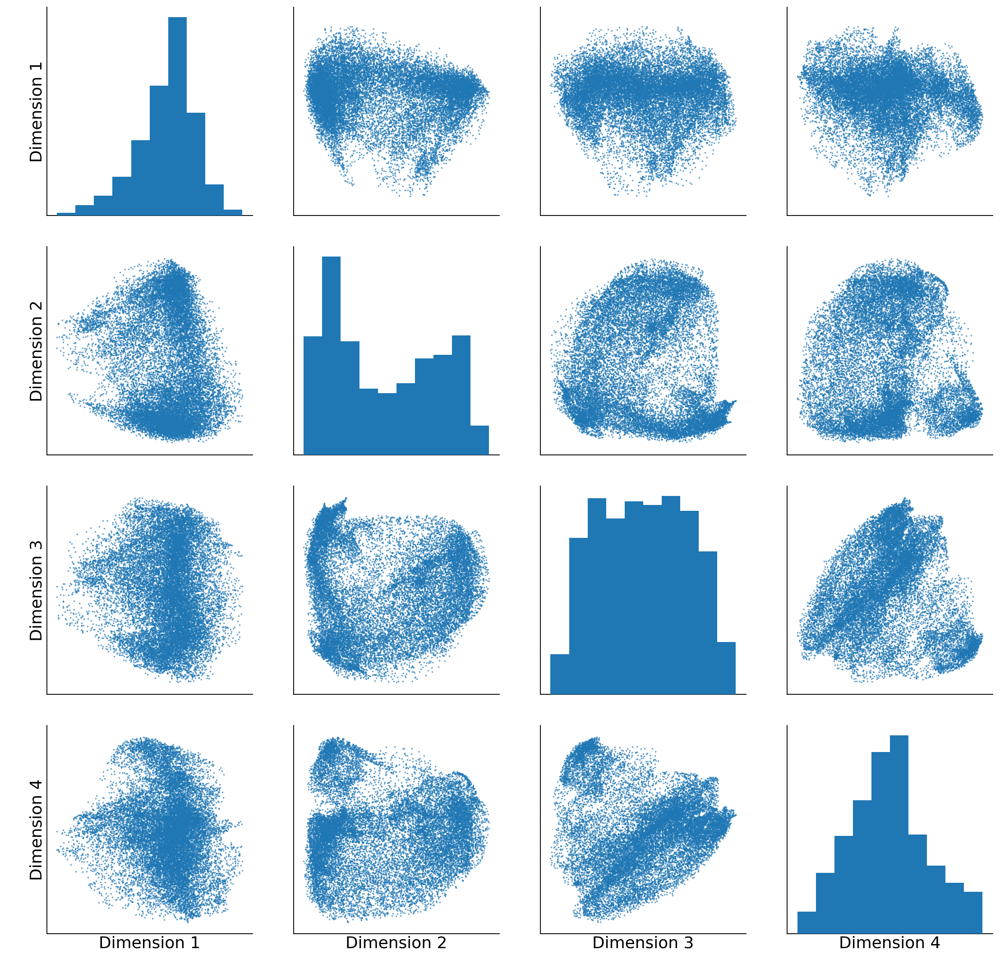

In [21]:
g = gs.plot.pairplot(mase.latent_left_, height=8, font_scale=2)